# Final Project

### Identifying Kepler Objects of Interest

In [1]:
import numpy as np

import jax
import jax.numpy as jnp

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

from flax import linen as nn

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from clu import metrics
from flax.training import train_state
from flax import struct
import optax

In [3]:
import matplotlib
matplotlib.rcParams['font.family'] = "serif"
plt.rcParams["mathtext.fontset"] = "dejavuserif"
font = {'size' : 14}
plt.rc('font', **font)

In [4]:
df = pd.read_csv('./data/cumulative_2025.12.07_12.18.53.csv', comment='#')
df.head()

,kepid,kepoi_name,kepler_name,koi_disposition,koi_vet_stat,koi_vet_date,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,...,koi_dicco_mdec,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err
0,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,0,...,0.200,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160
1,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,2018-08-16,CANDIDATE,0.969,0,0,...,0.000,0.480,0.390,0.360,0.490,0.340,0.120,0.730,0.500,0.450
2,10811496,K00753.01,NaN,CANDIDATE,Done,2018-08-16,CANDIDATE,0.000,0,0,...,-0.034,0.070,0.042,0.072,0.002,0.071,-0.027,0.074,0.027,0.074
3,10848459,K00754.01,NaN,FALSE POSITIVE,Done,2018-08-16,FALSE POSITIVE,0.000,0,1,...,0.147,0.078,0.289,0.079,-0.257,0.072,0.099,0.077,0.276,0.076
4,10854555,K00755.01,Kepler-664 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,0,...,-0.090,0.180,0.100,0.140,0.070,0.180,0.020,0.160,0.070,0.200


In [5]:
df.columns

Index(['kepid', 'kepoi_name', 'kepler_name', 'koi_disposition', 'koi_vet_stat',
       'koi_vet_date', 'koi_pdisposition', 'koi_score', 'koi_fpflag_nt',
       'koi_fpflag_ss',
       ...
       'koi_dicco_mdec', 'koi_dicco_mdec_err', 'koi_dicco_msky',
       'koi_dicco_msky_err', 'koi_dikco_mra', 'koi_dikco_mra_err',
       'koi_dikco_mdec', 'koi_dikco_mdec_err', 'koi_dikco_msky',
       'koi_dikco_msky_err'],
      dtype='object', length=140)

In [6]:
df = df[df['koi_disposition'].isin(['CONFIRMED', 'FALSE POSITIVE', 'CANDIDATE'])]

In [7]:
df['label'] = df['koi_disposition'].map({
    'CONFIRMED': 1,
    'CANDIDATE': 1,
    'FALSE POSITIVE': 0
})

In [8]:
planet_like = df[df['label'] == 1]
fp = df[df['label'] == 0]

print(len(planet_like))
print(len(fp))

4725
4839


In [9]:
number_df = df.select_dtypes(include=['float','int'])
features = number_df.columns
features = [col for col in features if 'err' not in col.lower()]
features = [col for col in features if 'label' not in col.lower()]
features = [col for col in features if 'koi_score' not in col.lower()]
features = [col for col in features if 'fpflag' not in col.lower()]

In [10]:
from sklearn.ensemble import RandomForestClassifier

X = df[features].fillna(df[features].median())
y = df['label']

rf = RandomForestClassifier(n_estimators=300, random_state=0)
rf.fit(X, y)

importances = rf.feature_importances_
for feat, imp in sorted(zip(features, importances), key=lambda x: -x[1]):
    print(f"{feat:15s} {imp:.3f}")

koi_dikco_msky  0.080
koi_prad        0.071
koi_dicco_msky  0.059
koi_ror         0.056
koi_fwm_stat_sig 0.054
koi_dor         0.048
koi_count       0.032
koi_period      0.032
koi_depth       0.028
koi_max_sngle_ev 0.028
koi_incl        0.026
koi_model_snr   0.026
koi_max_mult_ev 0.025
koi_sma         0.021
koi_duration    0.020
koi_insol       0.020
koi_impact      0.020
koi_srho        0.019
koi_num_transits 0.017
koi_teq         0.017
koi_fwm_srao    0.017
koi_smet        0.017
koi_dikco_mdec  0.016
koi_dikco_mra   0.015
koi_fwm_sdeco   0.015
koi_dicco_mra   0.012
koi_fwm_prao    0.011
koi_dicco_mdec  0.011
koi_bin_oedp_sig 0.011
koi_time0bk     0.011
koi_fwm_pdeco   0.010
koi_time0       0.010
koi_fwm_sdec    0.009
koi_ldm_coeff1  0.009
koi_srad        0.009
koi_fwm_sra     0.008
koi_slogg       0.008
dec             0.008
kepid           0.008
koi_smass       0.008
ra              0.008
koi_steff       0.008
koi_ldm_coeff2  0.007
koi_kmag        0.007
koi_gmag        0.006
koi_ke

In [11]:
# cutting down list of features

## without fpflags
# features = ['koi_period','koi_impact','koi_duration','koi_depth','koi_ror','koi_prad','koi_incl','koi_model_snr']
# units = ['(days)','','(hrs)','(ppm)','','(Earth radii)','(deg)','']

## without fpflags, with co_msky columns
features = ['koi_period','koi_impact','koi_duration','koi_depth','koi_ror','koi_prad','koi_incl','koi_model_snr','koi_dikco_msky','koi_dicco_msky']
units = ['(days)','','(hrs)','(ppm)','','(Earth radii)','(deg)','','','']

# with some fpflags
# features = ['koi_period','koi_impact','koi_duration','koi_depth','koi_ror','koi_prad','koi_incl','koi_model_snr','koi_fpflag_nt','koi_fpflag_ss']
# units = ['(days)','','(hrs)','(ppm)','','(Earth radii)','(deg)','','','']

# with all fpflags
# features = ['koi_period','koi_impact','koi_duration','koi_depth','koi_ror','koi_prad','koi_incl','koi_model_snr','koi_fpflag_nt','koi_fpflag_ss','koi_fpflag_co','koi_fpflag_ec']
# units = ['(days)','','(hrs)','(ppm)','','(Earth radii)','(deg)','','','','','']

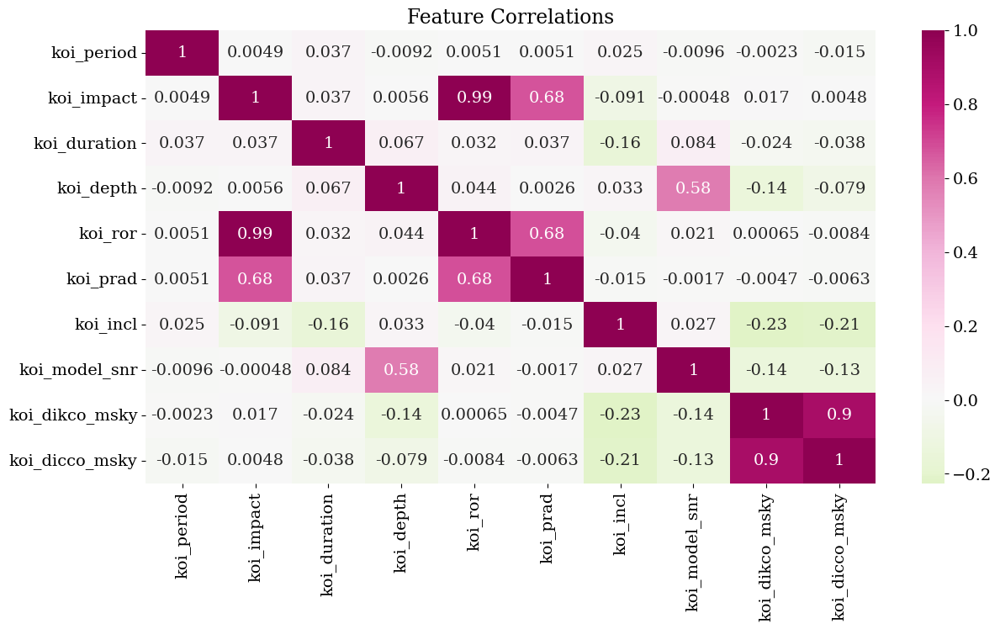

In [12]:
plt.figure(figsize=(14,7))
sns.heatmap(df[features].corr(), annot=True, cmap='PiYG_r', center=0)
plt.title('Feature Correlations')
plt.show()

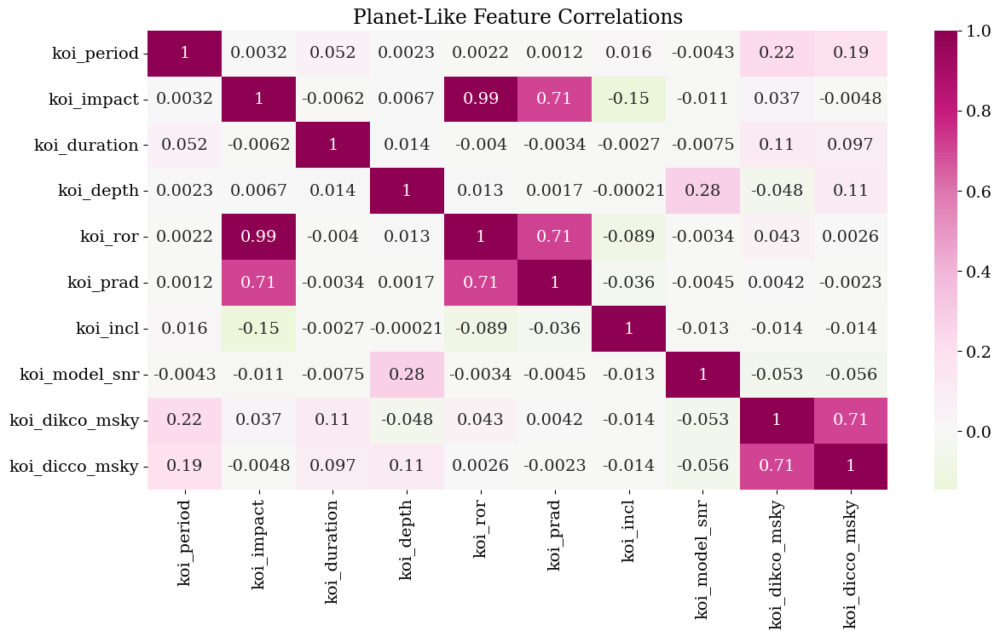

In [13]:
plt.figure(figsize=(14,7))
sns.heatmap(planet_like[features].corr(), annot=True, cmap='PiYG_r', center=0)
plt.title("Planet-Like Feature Correlations")
plt.show()

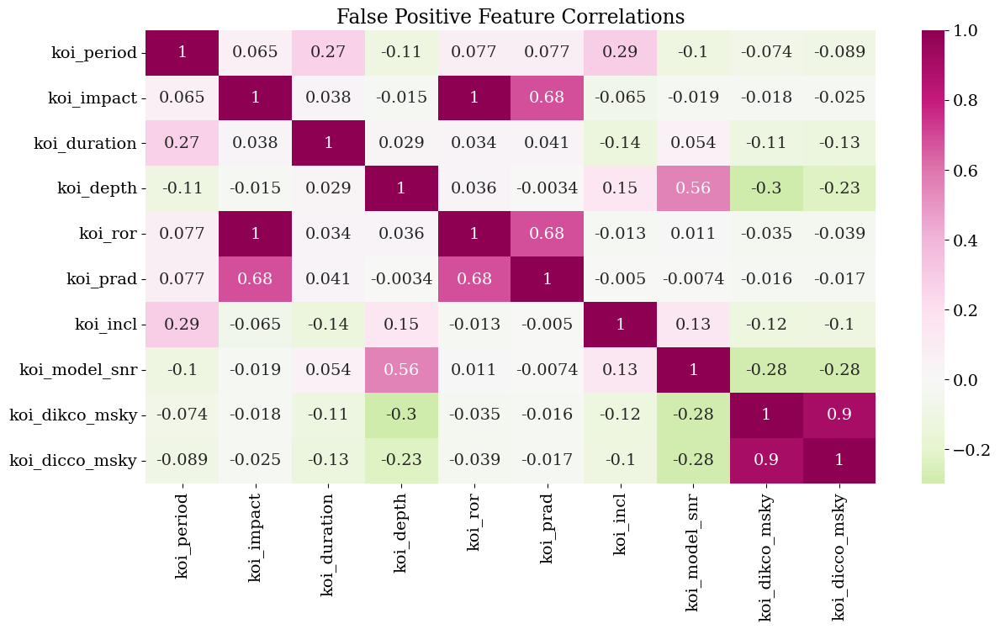

In [14]:
plt.figure(figsize=(14,7))
sns.heatmap(fp[features].corr(), annot=True, cmap='PiYG_r', center=0)
plt.title('False Positive Feature Correlations')
plt.show()

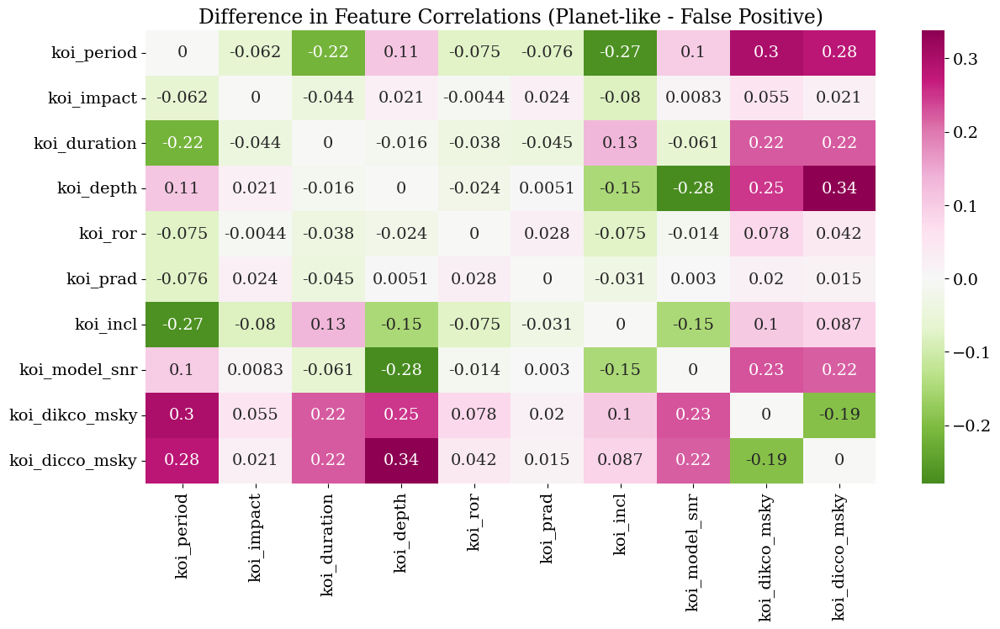

In [15]:
plt.figure(figsize=(14,7))
sns.heatmap(planet_like[features].corr()-fp[features].corr(), annot=True, cmap='PiYG_r', center=0)
plt.title('Difference in Feature Correlations (Planet-like - False Positive)')
plt.show()

In [16]:
mask = df[features].notna().all(axis=1)
df_clean = df[mask]

X = df_clean[features].to_numpy()
y = df_clean['label'].to_numpy()

print(X.shape, y.shape)

(8702, 10) (8702,)


In [17]:
for feat in features:
    s = df_clean[feat]

    summary = {
        "NaNs": s.isna().sum(),
        "infs": np.isinf(s).sum(),
        "zeros": (s == 0).sum(),
    }
    print(feat)
    print(summary)

koi_period
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(0)}
koi_impact
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(15)}
koi_duration
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(0)}
koi_depth
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(1)}
koi_ror
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(0)}
koi_prad
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(0)}
koi_incl
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(0)}
koi_model_snr
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(2)}
koi_dikco_msky
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(2)}
koi_dicco_msky
{'NaNs': np.int64(0), 'infs': np.int64(0), 'zeros': np.int64(7)}


In [18]:
# feat_zeros = ['koi_impact','koi_depth','koi_model_snr'] # for no co_msky
feat_zeros = ['koi_impact','koi_depth','koi_model_snr','koi_dikco_msky','koi_dicco_msky'] # with co_msky

mask = (df_clean[feat_zeros] != 0).all(axis=1)
df_plot = df_clean[mask]
df_plot.head()

,kepid,kepoi_name,kepler_name,koi_disposition,koi_vet_stat,koi_vet_date,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,...,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err,label
0,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,0,...,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160,1
1,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,2018-08-16,CANDIDATE,0.969,0,0,...,0.480,0.390,0.360,0.490,0.340,0.120,0.730,0.500,0.450,1
2,10811496,K00753.01,NaN,CANDIDATE,Done,2018-08-16,CANDIDATE,0.000,0,0,...,0.070,0.042,0.072,0.002,0.071,-0.027,0.074,0.027,0.074,1
3,10848459,K00754.01,NaN,FALSE POSITIVE,Done,2018-08-16,FALSE POSITIVE,0.000,0,1,...,0.078,0.289,0.079,-0.257,0.072,0.099,0.077,0.276,0.076,0
4,10854555,K00755.01,Kepler-664 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,0,...,0.180,0.100,0.140,0.070,0.180,0.020,0.160,0.070,0.200,1


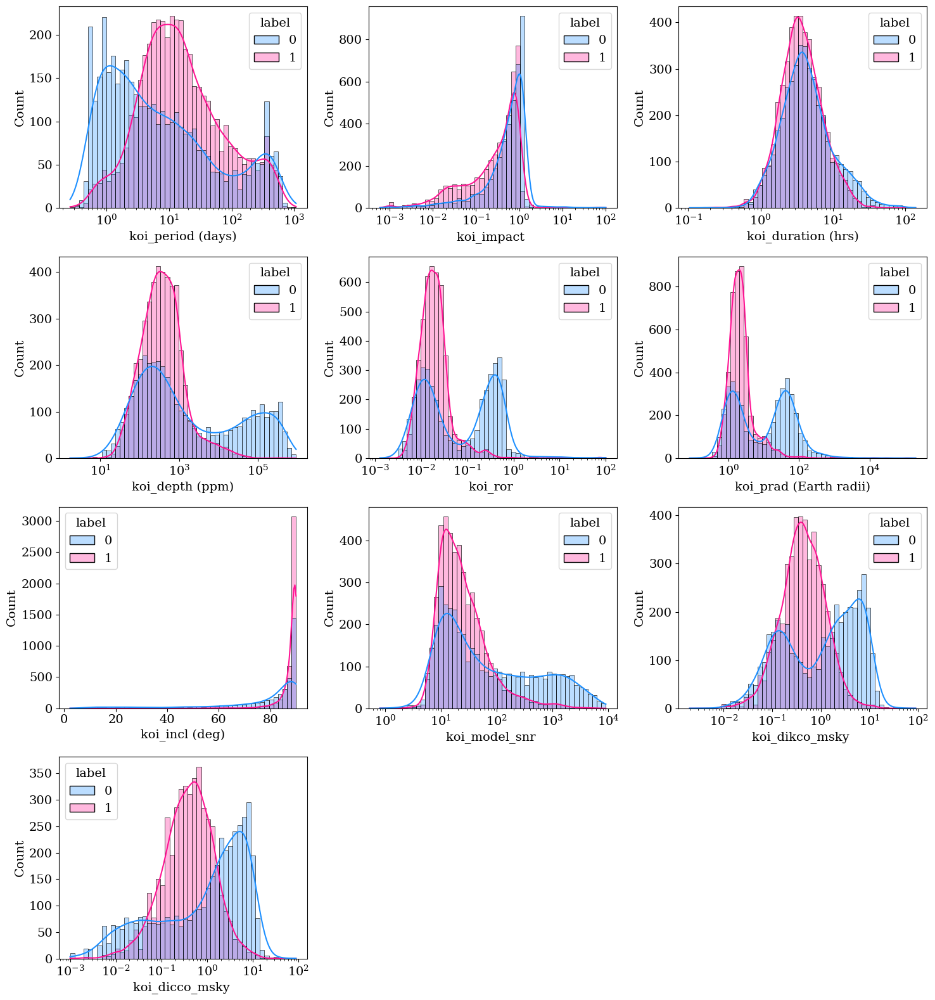

In [105]:
colors = {
    0: 'dodgerblue',
    1: 'deeppink'
}

n = len(features)
ncols = 3
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 4*nrows))
axes = axes.ravel()

i=0
for ax, feat, unit in zip(axes,features,units):
    if feat == 'koi_incl':
        sns.histplot(data=df_plot, x=feat, ax=ax, hue='label', palette=colors, alpha=0.3, bins=50, kde=True)
    else:
        sns.histplot(data=df_plot, x=feat, ax=ax, hue='label', palette=colors, alpha=0.3, bins=50, kde=True, log_scale=True)

    xlabel = f'{feat} {unit}'
    ax.set_xlabel(xlabel)

for j in range(n, len(axes)):
    fig.delaxes(axes[j])
    
fig.tight_layout()
plt.show()

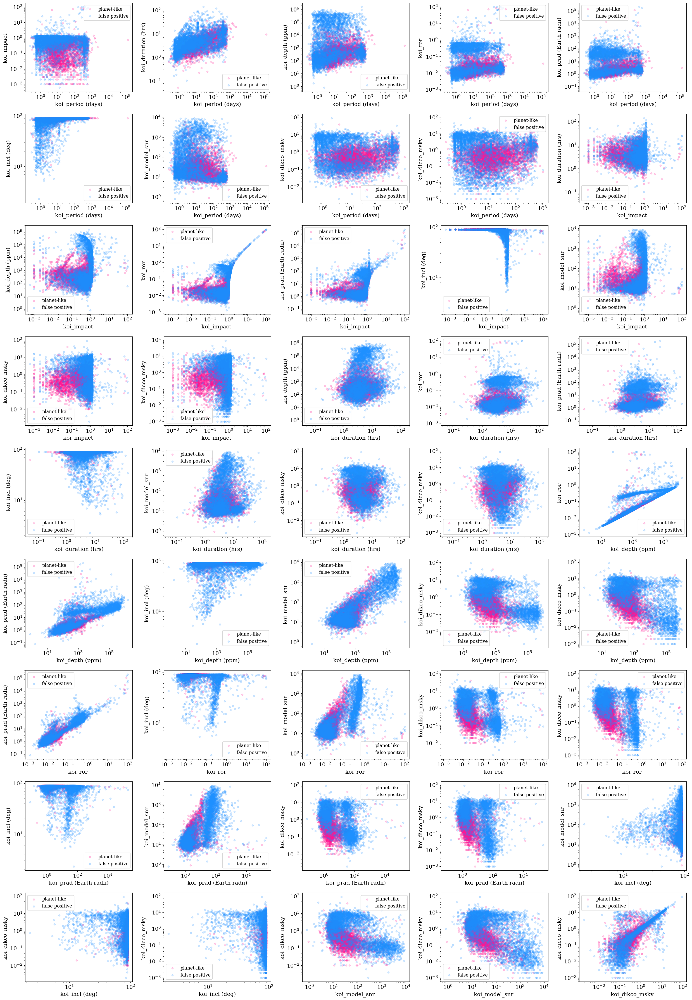

In [98]:
pairs = list(itertools.combinations(features, 2))
n = len(pairs)
ncols = 5
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 4*nrows))
axes = axes.ravel()

for ax, (f1, f2) in zip(axes, pairs):
    ax.scatter(planet_like[f1], planet_like[f2], s=20, alpha=0.2, color='deeppink', label='planet-like')
    ax.scatter(fp[f1], fp[f2], s=20, alpha=0.2, color='dodgerblue', label='false positive')
    
    i1 = features.index(f1)
    i2 = features.index(f2)
    xlabel = str(f1) + f' {units[i1]}'
    ylabel = str(f2) + f' {units[i2]}'
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.legend(fontsize='small')
    
for j in range(n, len(axes)):
    fig.delaxes(axes[j])
    
fig.tight_layout()
plt.show()

In [22]:
indices = np.arange(X.shape[0])
X_train, X_tst, y_train, y_tst, train_idx, test_idx = train_test_split(X, y, indices, test_size=0.1, stratify=y, random_state=0)

In [23]:
transformer = StandardScaler()

X_train = transformer.fit_transform(X_train)
X_tst = transformer.transform(X_tst)

In [24]:
X_train = jnp.array(X_train)
X_tst = jnp.array(X_tst)
y_train = jnp.array(y_train)
y_tst = jnp.array(y_tst)

In [25]:
batch_size = 64
n_batches = X_train.shape[0] // batch_size

X_train = X_train[:n_batches * batch_size].reshape((n_batches, batch_size, *X_train.shape[1:]))
y_train = y_train[:n_batches * batch_size].reshape((n_batches, batch_size, *y_train.shape[1:]))
X_train.shape, y_train.shape

((122, 64, 10), (122, 64))

In [26]:
n_classes = 2

class DenseClassifier(nn.Module):
    """A simple dense classifier."""

    @nn.compact
    def __call__(self, x):
        x = nn.Dense(32)(x) # increased from 10
        x = nn.relu(x)
        x = nn.Dense(16)(x) # increased from 10
        x = nn.relu(x)
        x = nn.Dense(16)(x) # added another layer
        x = nn.relu(x)
        x = nn.Dense(n_classes)(x)
        return x

In [27]:
dummy_input = jnp.ones((1, len(features)))
dnn = DenseClassifier()
print(dnn.tabulate(jax.random.PRNGKey(0), dummy_input))


                            DenseClassifier Summary                             
┏━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┓
┃ path    ┃ module          ┃ inputs        ┃ outputs       ┃ params           ┃
┡━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━┩
│         │ DenseClassifier │ float32[1,10] │ float32[1,2]  │                  │
├─────────┼─────────────────┼───────────────┼───────────────┼──────────────────┤
│ Dense_0 │ Dense           │ float32[1,10] │ float32[1,32] │ bias:            │
│         │                 │               │               │ float32[32]      │
│         │                 │               │               │ kernel:          │
│         │                 │               │               │ float32[10,32]   │
│         │                 │               │               │                  │
│         │                 │               │               │ 352 (1.4 KB)     │
├─────────┼────────────────

In [28]:
X_train.shape, y_train.shape

((122, 64, 10), (122, 64))

In [29]:
@struct.dataclass
class Metrics(metrics.Collection):
    accuracy: metrics.Accuracy
    loss: metrics.Average.from_output('loss')

class TrainState(train_state.TrainState):
   metrics: Metrics

In [30]:
def create_train_state(model, rng, learning_rate):
    params = model.init(rng, dummy_input)['params']
    tx = optax.adam(learning_rate)
    return TrainState.create(
        apply_fn=model.apply, params=params, tx=tx,
        metrics=Metrics.empty())

In [31]:
@jax.jit
def train_step(state, batch, label):
  """Train for a single step."""
  def loss_fn(params):
    logits = state.apply_fn({'params': params}, batch)
    loss = optax.softmax_cross_entropy_with_integer_labels(
        logits=logits, labels=label).mean()
    return loss
  grad_fn = jax.grad(loss_fn)
  grads = grad_fn(state.params)
  state = state.apply_gradients(grads=grads)
  return state

In [32]:
@jax.jit
def compute_metrics(*, state, batch, label):
    logits = state.apply_fn({'params': state.params}, batch)
    loss = optax.softmax_cross_entropy_with_integer_labels(
        logits=logits, labels=label).mean()
    metric_updates = state.metrics.single_from_model_output(
        logits=logits, labels=label, loss=loss)
    metrics = state.metrics.merge(metric_updates)
    state = state.replace(metrics=metrics)
    return state

In [33]:
init_rng = jax.random.PRNGKey(0)

learning_rate = 0.001 # lowered from 0.01

state = create_train_state(dnn, init_rng, learning_rate)
del init_rng  # Must not be used anymore.

In [34]:
metrics_history = {'train_loss': [],
                   'train_accuracy': [],
                   'test_loss': [],
                   'test_accuracy': []}

In [35]:
n_epochs = 100 # increased from 50

In [36]:
step = 0

for _ in range(n_epochs):
  for batch, label in zip(X_train, y_train):

    # Run optimization steps over training batches and compute batch metrics
    state = train_step(state, batch, label) # get updated train state (which contains the updated parameters)
    state = compute_metrics(state=state, batch=batch, label=label) # aggregate batch metrics

    if (step+1) % n_batches == 0: # one training epoch has passed
      for metric,value in state.metrics.compute().items(): # compute metrics
        metrics_history[f'train_{metric}'].append(value) # record metrics
      state = state.replace(metrics=state.metrics.empty()) # reset train_metrics for next training epoch

      # Compute metrics on the test set after each training epoch
      test_state = state
      test_state = compute_metrics(state=test_state, batch=X_tst, label=y_tst)

      for metric,value in test_state.metrics.compute().items():
        metrics_history[f'test_{metric}'].append(value)

      print(f"train epoch: {(step+1) // n_batches}, "
            f"loss: {metrics_history['train_loss'][-1]}, "
            f"accuracy: {metrics_history['train_accuracy'][-1] * 100}")
      print(f"test epoch: {(step+1) // n_batches}, "
            f"loss: {metrics_history['test_loss'][-1]}, "
            f"accuracy: {metrics_history['test_accuracy'][-1] * 100}")
    step += 1

train epoch: 1, loss: 0.48639652132987976, accuracy: 80.21260833740234
test epoch: 1, loss: 0.3685266971588135, accuracy: 83.6968994140625
train epoch: 2, loss: 0.3446730673313141, accuracy: 85.2843246459961
test epoch: 2, loss: 0.3400995135307312, accuracy: 85.648681640625
train epoch: 3, loss: 0.3241814970970154, accuracy: 85.89907836914062
test epoch: 3, loss: 0.3261313736438751, accuracy: 86.45235443115234
train epoch: 4, loss: 0.3131852149963379, accuracy: 86.56505584716797
test epoch: 4, loss: 0.3184906840324402, accuracy: 87.02640533447266
train epoch: 5, loss: 0.30643346905708313, accuracy: 86.98770141601562
test epoch: 5, loss: 0.3138258159160614, accuracy: 87.1412124633789
train epoch: 6, loss: 0.3014344573020935, accuracy: 87.192626953125
test epoch: 6, loss: 0.3088721036911011, accuracy: 87.71527099609375
train epoch: 7, loss: 0.29779890179634094, accuracy: 87.28227233886719
test epoch: 7, loss: 0.30618593096733093, accuracy: 87.37083435058594
train epoch: 8, loss: 0.294812

In [37]:
print('Mean training accuracy: %.3f' % np.mean(metrics_history['train_accuracy']))
print('Mean testing accuracy: %.3f' % np.mean(metrics_history['test_accuracy']))

Mean training accuracy: 0.892
Mean testing accuracy: 0.886


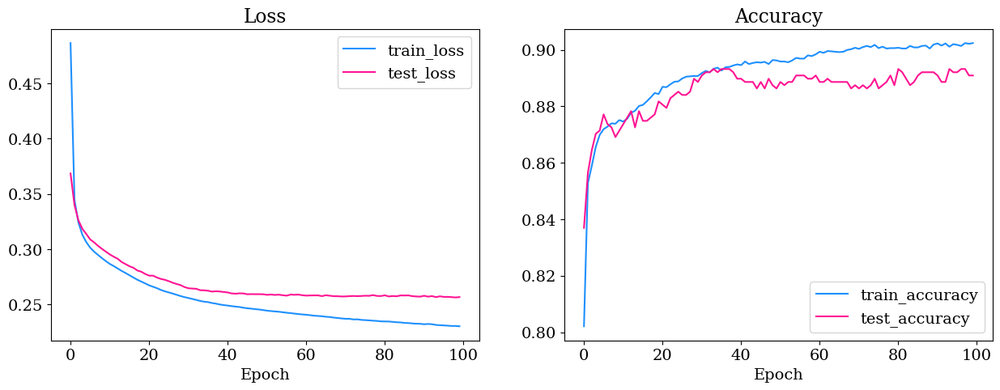

<Figure size 640x480 with 0 Axes>

In [38]:
# Plot loss and accuracy in subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.set_title('Loss')
ax2.set_title('Accuracy')
colors2 = {
    'train': 'dodgerblue',
    'test': 'deeppink'
}
for dataset in ('train','test'):
  ax1.plot(metrics_history[f'{dataset}_loss'], label=f'{dataset}_loss', color=colors2[dataset])
  ax2.plot(metrics_history[f'{dataset}_accuracy'], label=f'{dataset}_accuracy', color=colors2[dataset])
ax1.set_xlabel('Epoch')
ax2.set_xlabel('Epoch')
ax1.legend()
ax2.legend()
plt.show()
plt.clf()

In [39]:
@jax.jit
def pred_step(state, batch):
  logits = state.apply_fn({'params': state.params}, batch)
  return logits.argmax(axis=1)

pred = pred_step(state, X_tst)

Text(0.5, 0, 'Probability of Being a Planet')

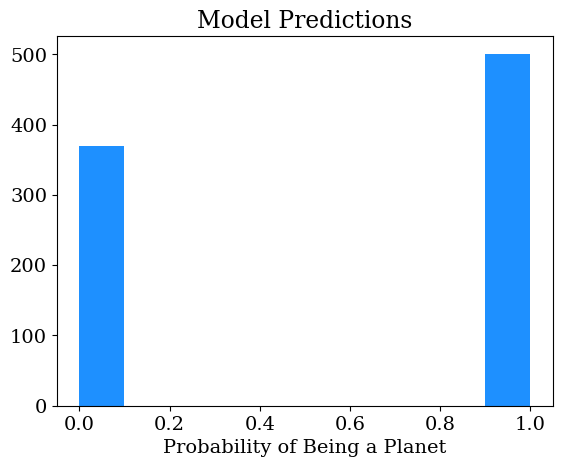

In [107]:
plt.hist(pred, color='dodgerblue')
plt.title('Model Predictions')
plt.xlabel('Probability of Being a Planet')

Text(0.5, 0, 'Logit Value')

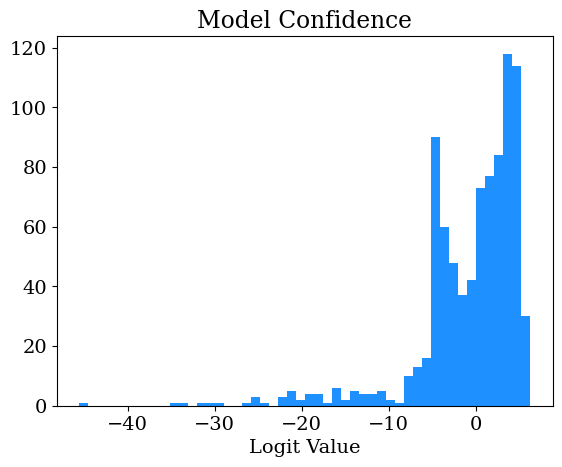

In [41]:
outputs = state.apply_fn({'params': state.params}, X_tst)
plt.hist(jnp.diff(outputs, axis=1).flatten(), color='dodgerblue', bins=50);
plt.title('Model Confidence')
plt.xlabel('Logit Value')
# plt.xlim(-20,5)

In [42]:
logit = jnp.diff(outputs, axis=1).flatten()
print('Logit shape:', logit.shape)
print('Number of positive logits:', jnp.sum(logit > 0))

Logit shape: (871,)
Number of positive logits: 501


In [43]:
def check(state, batch, labels):
    logits = state.apply_fn({'params': state.params}, batch)
    pred = jnp.argmax(logits, axis=1) 
    
    ncats = 2

    confusion_matrix = np.zeros((ncats, ncats))

    for truth, guess in zip(labels, pred):
        confusion_matrix[int(truth), int(guess)] += 1
        
    print("Confusion Matrix:\n", confusion_matrix)
    
    confusion_matrix_norm = confusion_matrix / confusion_matrix.sum()
    print("Normalized Confusion Matrix:\n", confusion_matrix_norm)

    sns.heatmap(confusion_matrix, annot=True, fmt='.0f', cmap="RdPu", xticklabels=['FP', 'planet-like'], yticklabels=['FP', 'planet-like'])
    plt.title('Confusion Matrix')
    plt.xlabel("Prediction")
    plt.ylabel("Truth")
    plt.show()
    
    sns.heatmap(confusion_matrix_norm, annot=True, fmt='.2f', cmap="RdPu", xticklabels=['FP', 'planet-like'], yticklabels=['FP', 'planet-like'])
    plt.title('Normalized Confusion Matrix')
    plt.xlabel("Prediction")
    plt.ylabel("Truth")
    plt.show()

Confusion Matrix:
 [[346.  71.]
 [ 24. 430.]]
Normalized Confusion Matrix:
 [[0.39724455 0.0815155 ]
 [0.02755454 0.49368542]]


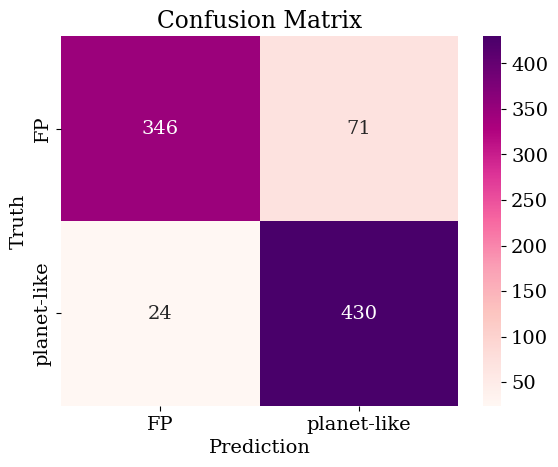

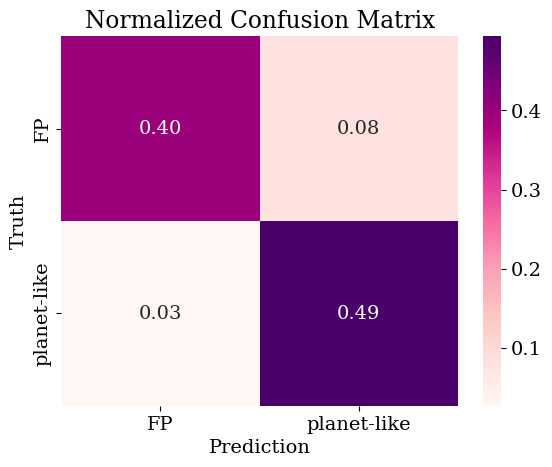

In [44]:
cm = check(state, X_tst, y_tst)

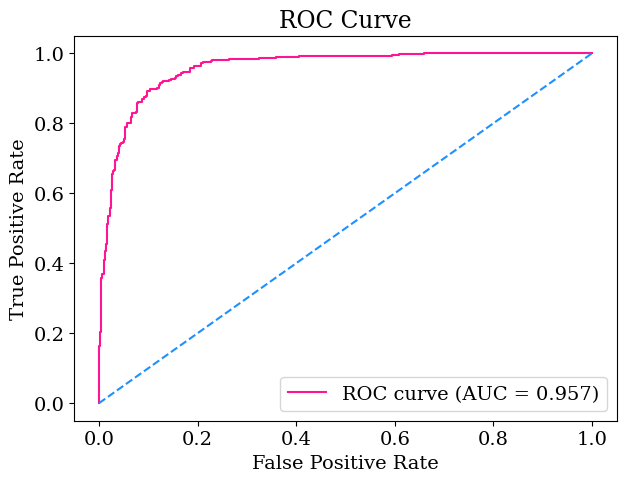

In [45]:
from sklearn.metrics import roc_curve, auc

# Forward pass to get logits
logits = state.apply_fn({'params': state.params}, X_tst)
probs = logits[:, 1]

fpr, tpr, thresholds = roc_curve(y_tst, probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.3f})', color='deeppink')
plt.plot([0, 1], [0, 1], linestyle='--', color='dodgerblue')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

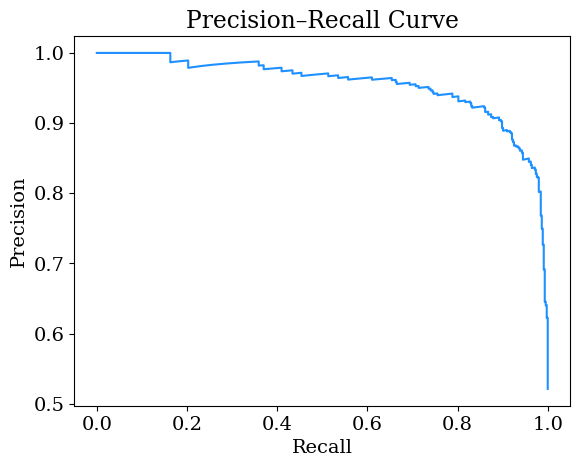

In [46]:
from sklearn.metrics import precision_recall_curve

prec, rec, _ = precision_recall_curve(y_tst, probs)
plt.plot(rec, prec, color='dodgerblue')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision–Recall Curve')
plt.show()

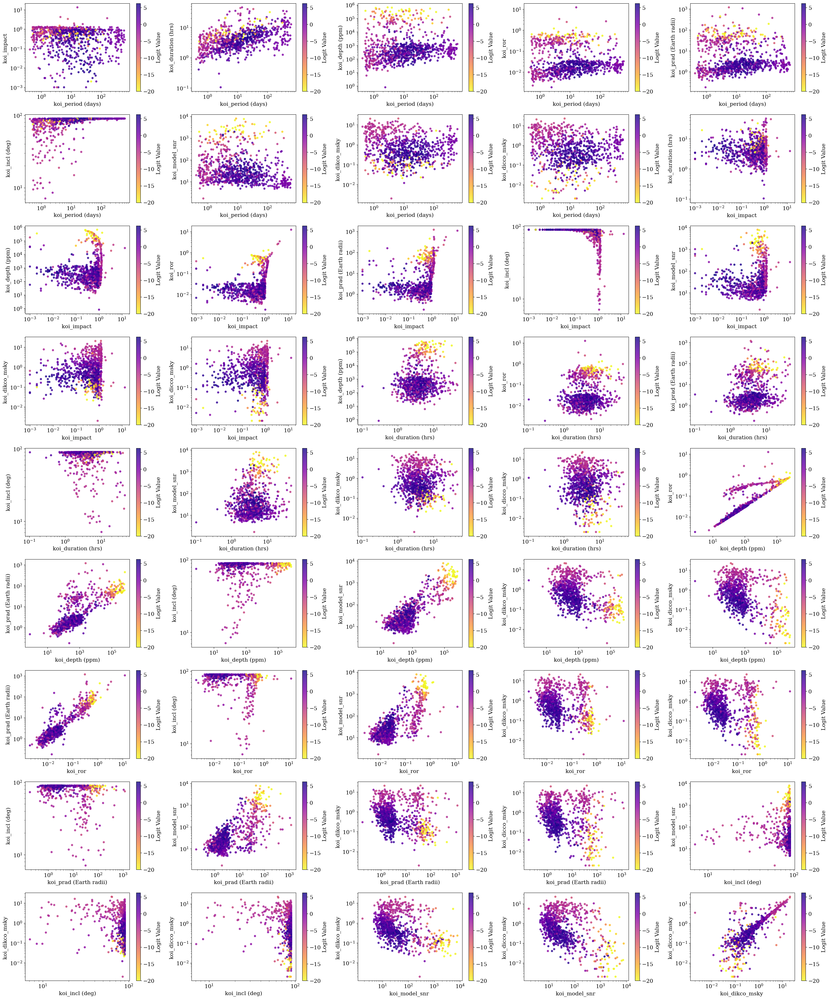

In [96]:
logit_val = jnp.diff(outputs, axis=1).flatten()

pairs = list(itertools.combinations(features, 2))
n = len(pairs)
ncols = 5
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 4*nrows))
axes = axes.ravel()

for ax, (f1, f2) in zip(axes, pairs):
    f1_arr = np.array(df_clean[f1])
    f1_test = f1_arr[test_idx]
    f2_arr = np.array(df_clean[f2])
    f2_test = f2_arr[test_idx]
    # max_logit = np.max(logit_val)
    sc = ax.scatter(f1_test, f2_test, alpha=0.8, c=logit_val, s=20, cmap='plasma_r', vmin=-20)
    
    i1 = features.index(f1)
    i2 = features.index(f2)
    xlabel = str(f1) + f' {units[i1]}'
    ylabel = str(f2) + f' {units[i2]}'
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    fig.colorbar(sc, ax=ax, label='Logit Value')

for j in range(n, len(axes)):
    fig.delaxes(axes[j])
    
fig.tight_layout()
plt.show()

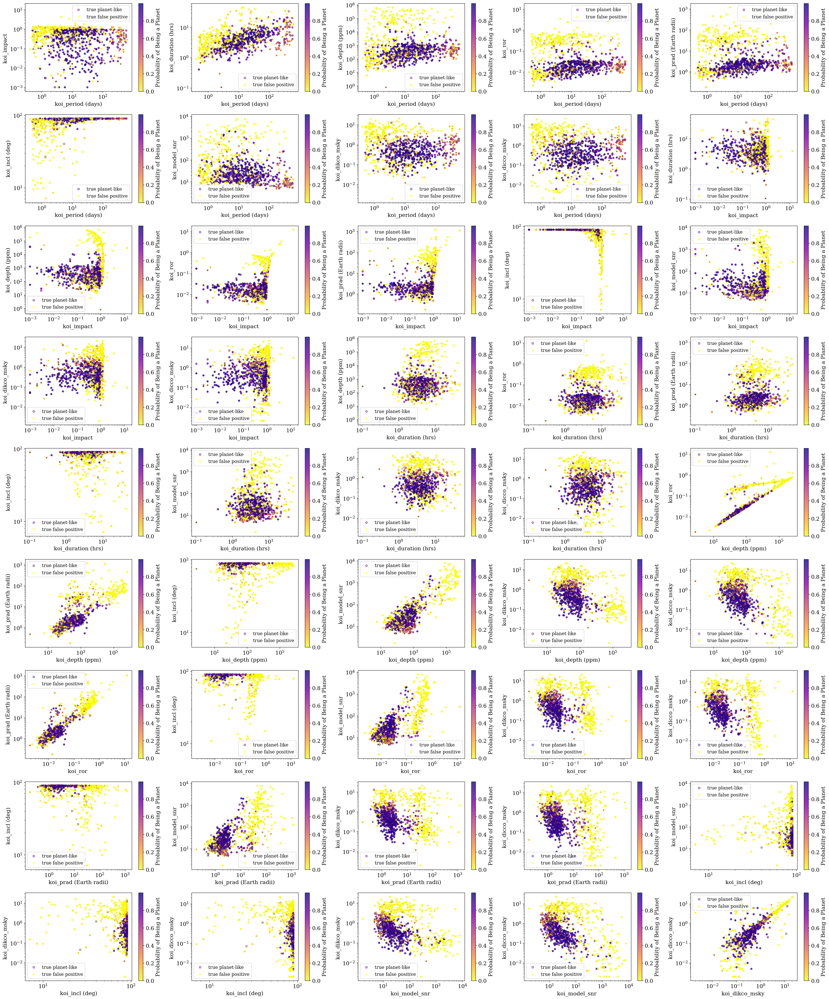

In [97]:
probs = jax.nn.softmax(outputs, axis=1)
prob_planet_like = probs[:, 1].flatten()
truth_arr = np.array(df_clean['label'])
truth_test = truth_arr[test_idx]

pairs = list(itertools.combinations(features, 2))
n = len(pairs)
ncols = 5
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 4*nrows))
axes = axes.ravel()

for ax, (f1, f2) in zip(axes, pairs):
    f1_arr = np.array(df_clean[f1])
    f1_test = f1_arr[test_idx]
    f2_arr = np.array(df_clean[f2])
    f2_test = f2_arr[test_idx]

    edge_colors = np.where(truth_test == 0, 'yellow', 'indigo')
    ax.scatter([],[],edgecolor='indigo',label='true planet-like',marker='o',facecolor='none',s=20)
    ax.scatter([],[],edgecolor='yellow',label='true false positive',marker='o',facecolor='none',s=20)

    sc = ax.scatter(f1_test, f2_test, alpha=0.8, c=prob_planet_like, s=20, cmap='plasma_r', edgecolor=edge_colors, lw=0.8)
    
    i1 = features.index(f1)
    i2 = features.index(f2)
    xlabel = str(f1) + f' {units[i1]}'
    ylabel = str(f2) + f' {units[i2]}'
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    fig.colorbar(sc, ax=ax, label='Probability of Being a Planet')
    ax.legend(fontsize='small')

for j in range(n, len(axes)):
    fig.delaxes(axes[j])
    
fig.tight_layout()
plt.show()

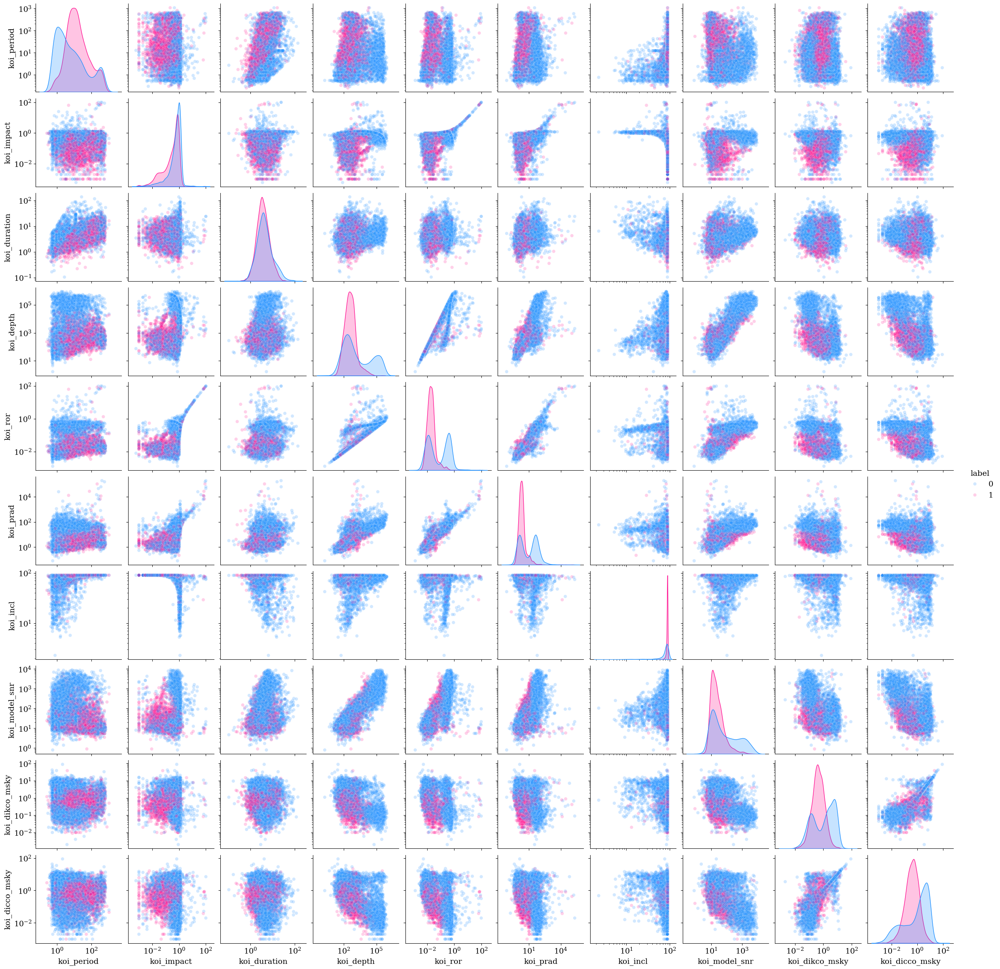

In [78]:
g = sns.pairplot(df_plot, vars=features, hue='label', palette=colors, diag_kws={'log_scale': True}, plot_kws={'alpha': 0.2});
for ax in g.axes.flat:
    if ax.get_xlabel() in features:
        ax.set(xscale="log")
    if ax.get_ylabel() in features:
        ax.set(yscale="log")